# **Installing reqquired libs**

In [ ]:
pip install numpy matplotlib colour_demosaicing pillow opencv-python open3d-python

In [31]:
!pip uninstall open3d-python --yes
!pip uninstall open3d --yes
!conda install -c open3d-admin open3d

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: - 
Found conflicts! Looking for incompatible packages.
This can take several minutes.  Press CTRL-C to abort.
                                                                               failed

UnsatisfiableError: The following specifications were found
to be incompatible with the existing python installation in your environment:

Specifications:

  - open3d -> python[version='>=2.7,<2.8.0a0|>=3.5,<3.6.0a0|>=3.6,<3.7.0a0|>=3.9,<3.10.0a0|>=3.7,<3.8.0a0|>=3.8,<3.9.0a0']

Your python: python=3.11

If python is on the left-most side of the chain, that's the version you've asked for.
When python appears to the right, that indicates that the thing on the left is somehow
not available for the pyt

In [3]:
!git clone https://github.com/ori-mrg/robotcar-dataset-sdk.git

Cloning into 'robotcar-dataset-sdk'...
remote: Enumerating objects: 302, done.
remote: Counting objects: 100% (61/61), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 302 (delta 44), reused 38 (delta 38), pack-reused 241
Receiving objects: 100% (302/302), 67.54 MiB | 44.94 MiB/s, done.
Resolving deltas: 100% (119/119), done.


# **Image Demosaicing and Undistortion of the Images**

In [24]:
import re
import os
from PIL import Image
from colour_demosaicing import demosaicing_CFA_Bayer_bilinear as demosaic
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import map_coordinates

# Define Bayer patterns
BAYER_STEREO = 'gbrg'
BAYER_MONO = 'rggb'

# Define the CameraModel class
class CameraModel:
    def __init__(self, models_dir, images_dir):
        self.camera = None
        self.camera_sensor = None
        self.focal_length = None
        self.principal_point = None
        self.G_camera_image = None
        self.bilinear_lut = None

        self.__load_intrinsics(models_dir, images_dir)
        self.__load_lut(models_dir, images_dir)

    def undistort(self, image):
        lut = self.bilinear_lut[:, 1::-1].T.reshape((2, image.shape[0], image.shape[1]))

        undistorted = np.rollaxis(np.array([map_coordinates(image[:, :, channel], lut, order=1)
                                            for channel in range(0, image.shape[2])]), 0, 3)

        return undistorted.astype(image.dtype)

    def __get_model_name(self, images_dir):
        self.camera = re.search('(stereo|mono_(left|right|rear))', images_dir).group(0)
        if self.camera == 'stereo':
            self.camera_sensor = re.search('(left|centre|right)', images_dir).group(0)
            if self.camera_sensor == 'left':
                return 'stereo_wide_left'
            elif self.camera_sensor == 'right':
                return 'stereo_wide_right'
            elif self.camera_sensor == 'centre':
                return 'stereo_narrow_left'
            else:
                raise RuntimeError('Unknown camera model for given directory: ' + images_dir)
        else:
            return self.camera

    def __load_intrinsics(self, models_dir, images_dir):
        model_name = self.__get_model_name(images_dir)
        intrinsics_path = os.path.join(models_dir, model_name + '.txt')

        with open(intrinsics_path) as intrinsics_file:
            vals = [float(x) for x in next(intrinsics_file).split()]
            self.focal_length = (vals[0], vals[1])
            self.principal_point = (vals[2], vals[3])

            G_camera_image = []
            for line in intrinsics_file:
                G_camera_image.append([float(x) for x in line.split()])
            self.G_camera_image = np.array(G_camera_image)

    def __load_lut(self, models_dir, images_dir):
        model_name = self.__get_model_name(images_dir)
        lut_path = os.path.join(models_dir, model_name + '_distortion_lut.bin')

        lut = np.fromfile(lut_path, np.double)
        lut = lut.reshape([2, lut.size // 2])
        self.bilinear_lut = lut.transpose()

def load_image(image_path, model=None):
    camera = re.search('(stereo|mono_(left|right|rear))', image_path).group(0)
    pattern = BAYER_STEREO if camera == 'stereo' else BAYER_MONO

    img = Image.open(image_path)
    img = demosaic(img, pattern)
    
    if model:
        img = model.undistort(img)
    
    return np.array(img).astype(np.uint8)



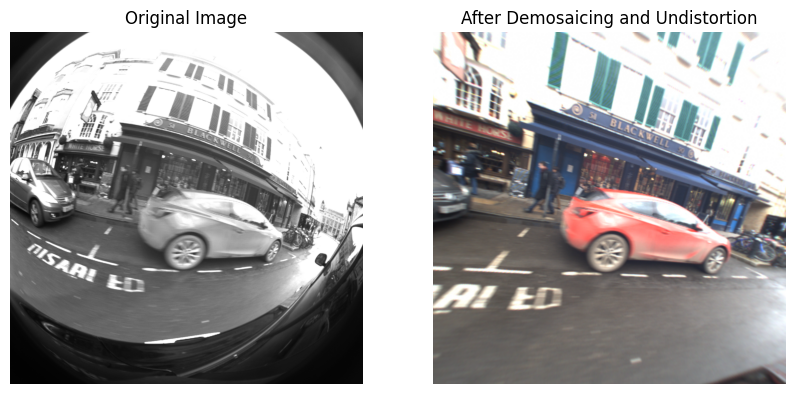

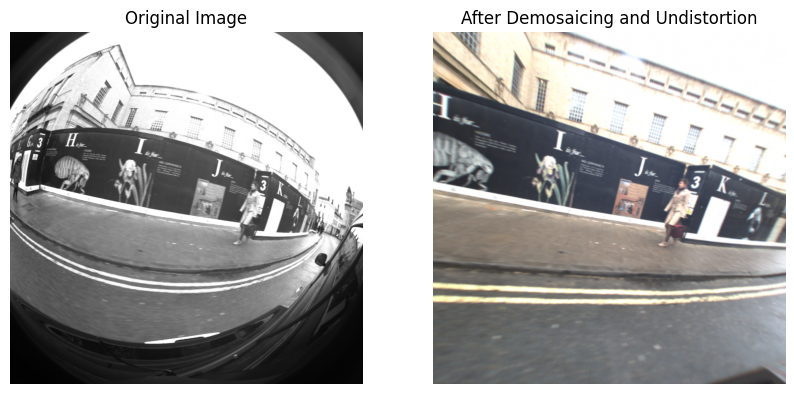

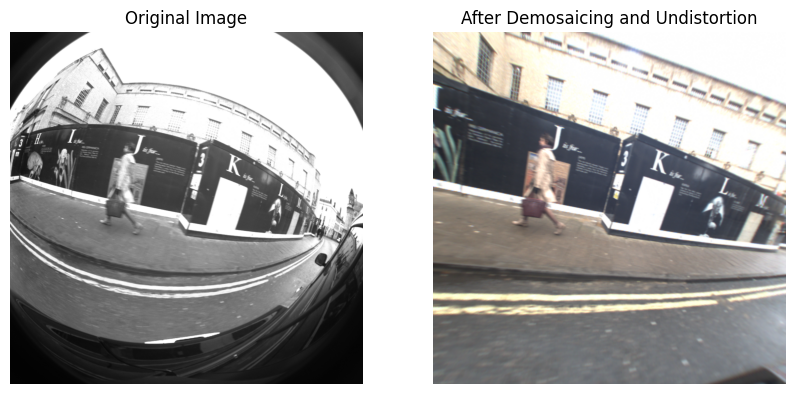

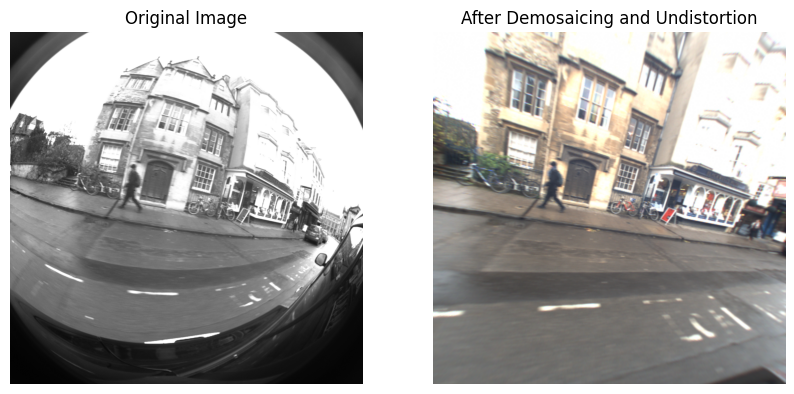

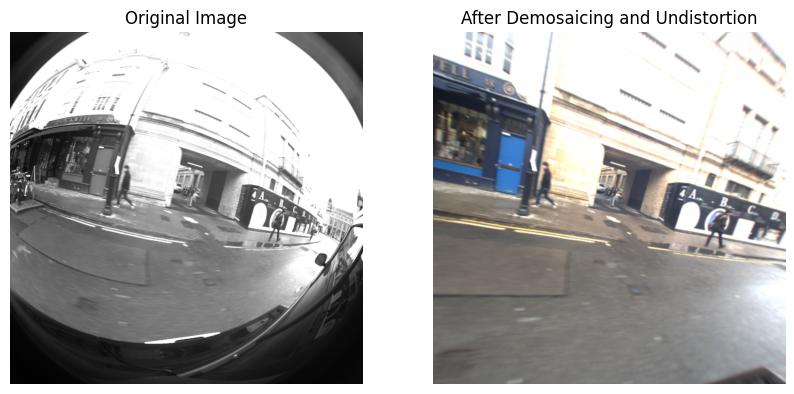

In [25]:
# Directory containing images
directory = "data/mono_left"

# Create a camera model object if available
models_dir = "robotcar-dataset-sdk/models"  # Replace with the actual path
model = CameraModel(models_dir, directory) if models_dir else None

# Counter to keep track of displayed images
displayed_images = 0

# Iterate through the images in the directory
for filename in os.listdir(directory):
    if not filename.startswith("._") and filename.endswith(".png"):
        image_path = os.path.join(directory, filename)
        image = load_image(image_path, model)
        image_org = Image.open(image_path).convert("RGB")
        
        
      

        # Display the only 5 images
                
        if displayed_images < 5:
            
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(image_org)
            plt.title('Original Image')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(image)
            plt.title('After Demosaicing and Undistortion')
            plt.axis('off')
        
        
        # Save all the images
        save_path = os.path.join("output/mono_left", filename)
        plt.imsave(save_path, image)
        
        displayed_images += 1

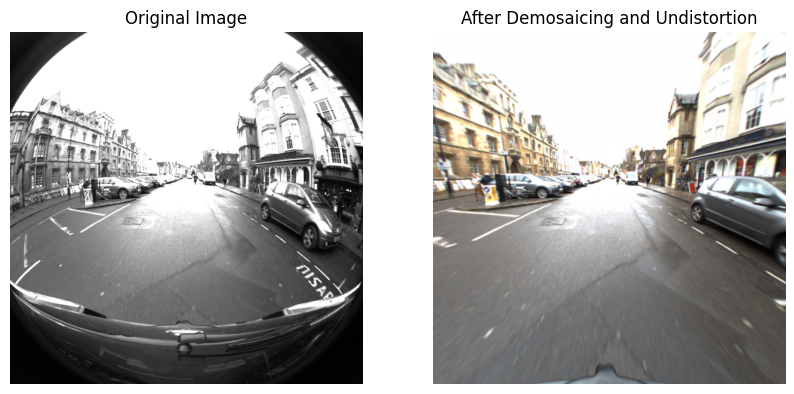

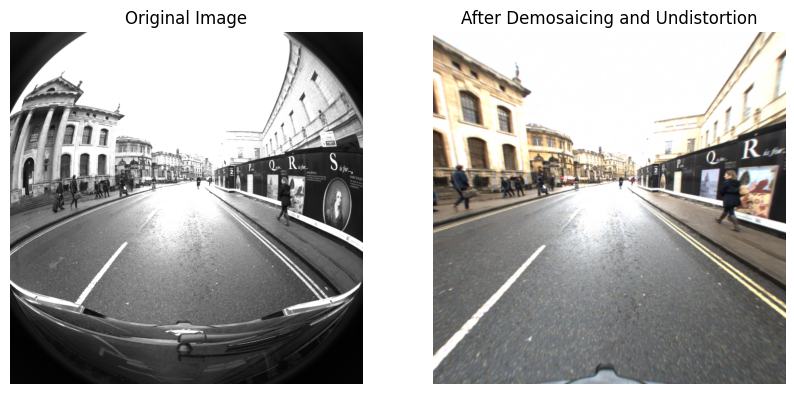

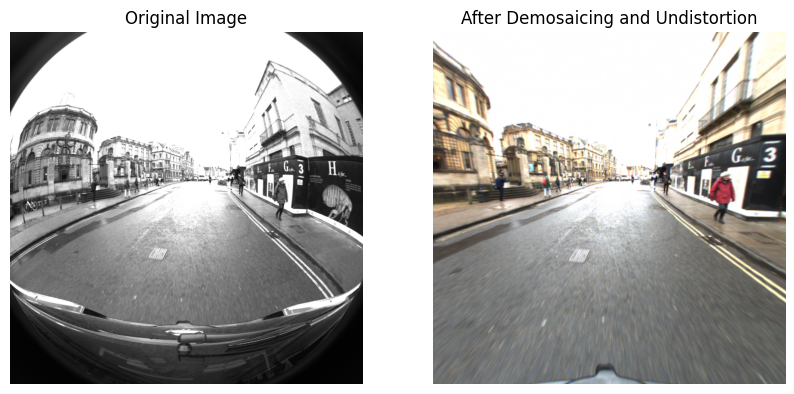

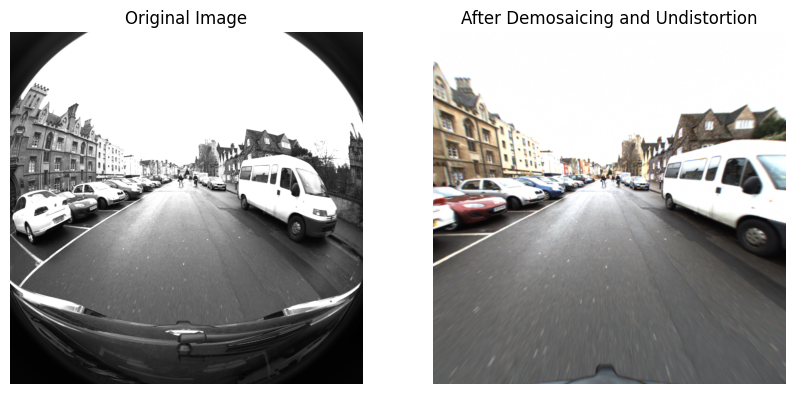

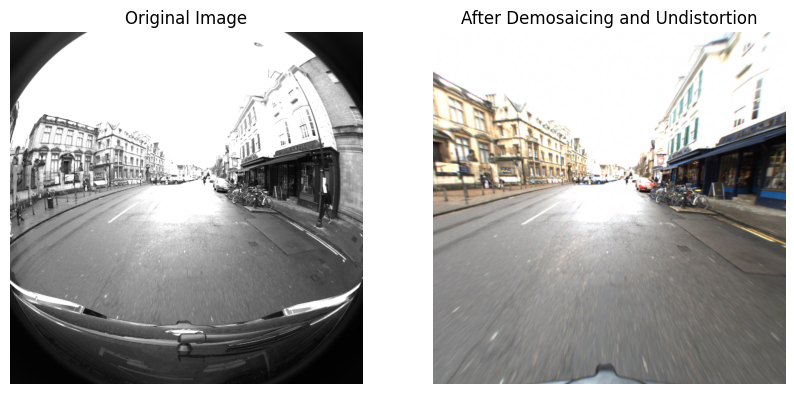

In [26]:
# Directory containing images
directory = "data/mono_rear"

# Create a camera model object if available
models_dir = "robotcar-dataset-sdk/models"  # Replace with the actual path
model = CameraModel(models_dir, directory) if models_dir else None

# Counter to keep track of displayed images
displayed_images = 0

# Iterate through the images in the directory
for filename in os.listdir(directory):
    if not filename.startswith("._") and filename.endswith(".png"):
        image_path = os.path.join(directory, filename)
        image = load_image(image_path, model)
        image_org = Image.open(image_path).convert("RGB")
        
        
      

        # Display the only 5 images
                
        if displayed_images < 5:
            
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(image_org)
            plt.title('Original Image')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(image)
            plt.title('After Demosaicing and Undistortion')
            plt.axis('off')
        
        
        # Save all the images
        save_path = os.path.join("output/mono_rear", filename)
        plt.imsave(save_path, image)
        
        displayed_images += 1

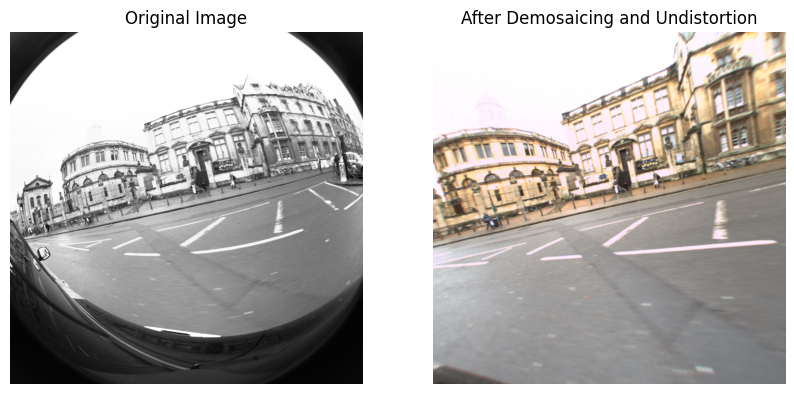

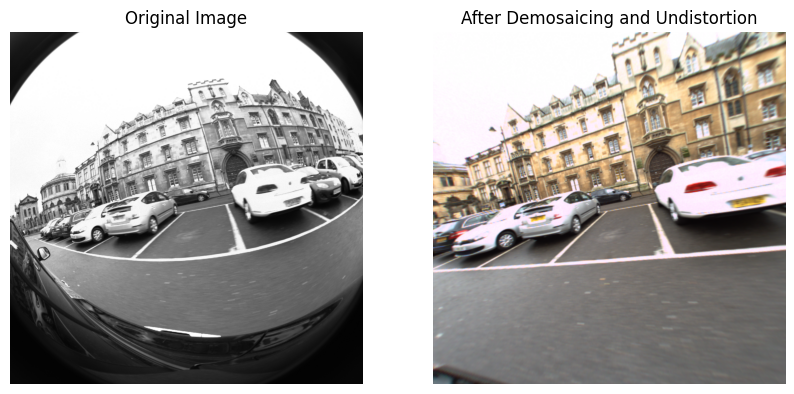

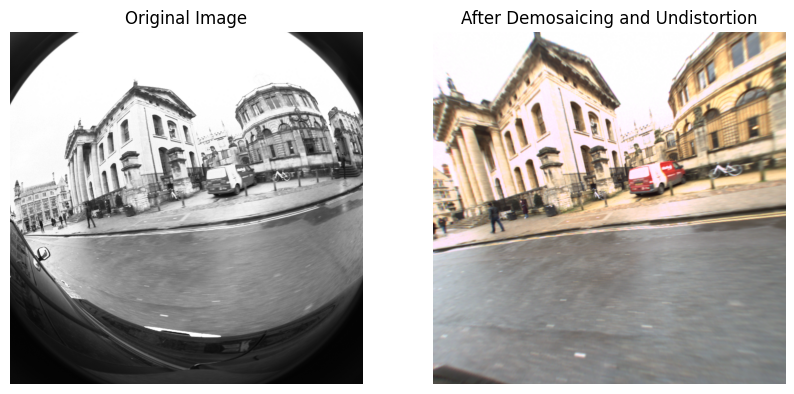

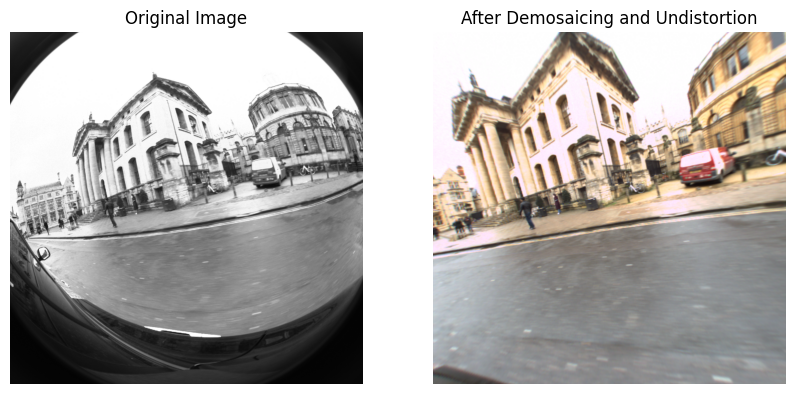

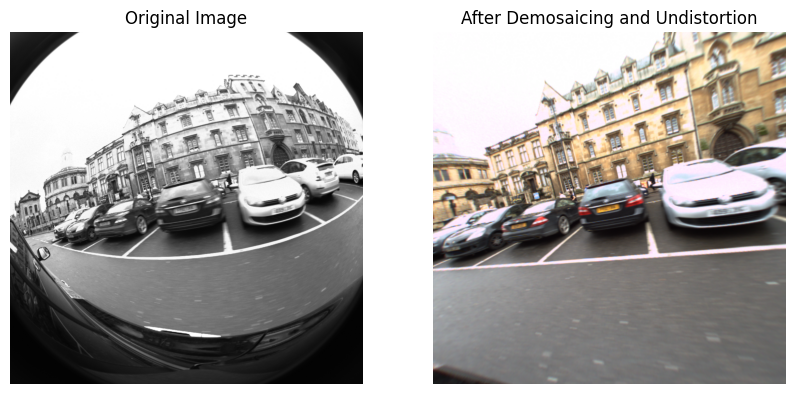

In [27]:
# Directory containing images
directory = "data/mono_right"

# Create a camera model object if available
models_dir = "robotcar-dataset-sdk/models"  # Replace with the actual path
model = CameraModel(models_dir, directory) if models_dir else None

# Counter to keep track of displayed images
displayed_images = 0

# Iterate through the images in the directory
for filename in os.listdir(directory):
    if not filename.startswith("._") and filename.endswith(".png"):
        image_path = os.path.join(directory, filename)
        image = load_image(image_path, model)
        image_org = Image.open(image_path).convert("RGB")
        
        
      

        # Display the only 5 images
                
        if displayed_images < 5:
            
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(image_org)
            plt.title('Original Image')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(image)
            plt.title('After Demosaicing and Undistortion')
            plt.axis('off')
        
        
        # Save all the images
        save_path = os.path.join("output/mono_right", filename)
        plt.imsave(save_path, image)
        
        displayed_images += 1

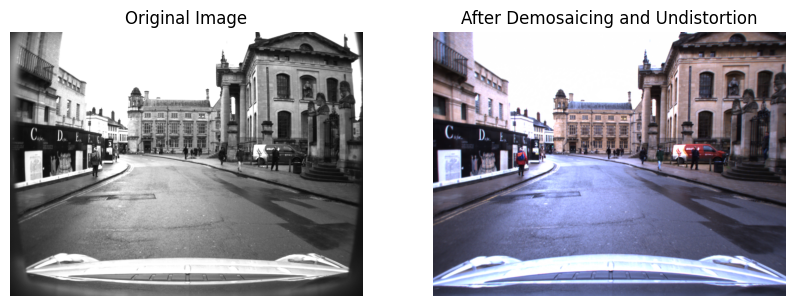

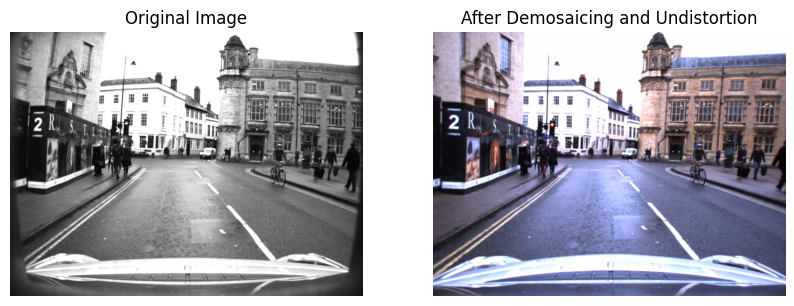

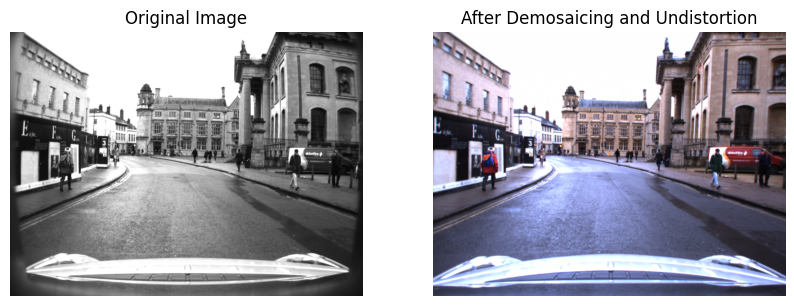

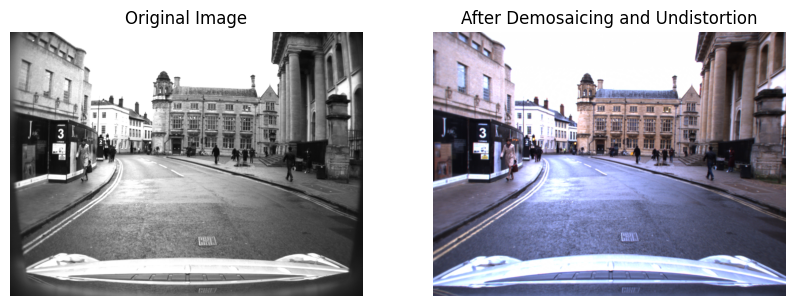

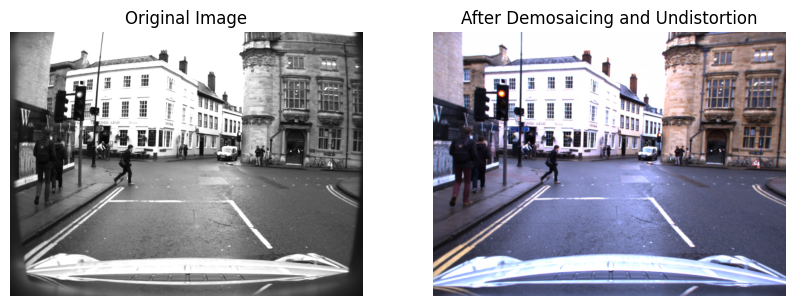

In [28]:
# Directory containing images
directory = "data/stereo/centre"

# Create a camera model object if available
models_dir = "robotcar-dataset-sdk/models"  # Replace with the actual path
model = CameraModel(models_dir, directory) if models_dir else None

# Counter to keep track of displayed images
displayed_images = 0

# Iterate through the images in the directory
for filename in os.listdir(directory):
    if not filename.startswith("._") and filename.endswith(".png"):
        image_path = os.path.join(directory, filename)
        image = load_image(image_path, model)
        image_org = Image.open(image_path).convert("RGB")
        
        
      

        # Display the only 5 images
                
        if displayed_images < 5:
            
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(image_org)
            plt.title('Original Image')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(image)
            plt.title('After Demosaicing and Undistortion')
            plt.axis('off')
        
        
        # Save all the images
        save_path = os.path.join("output/stereo/centre", filename)
        plt.imsave(save_path, image)
        
        displayed_images += 1

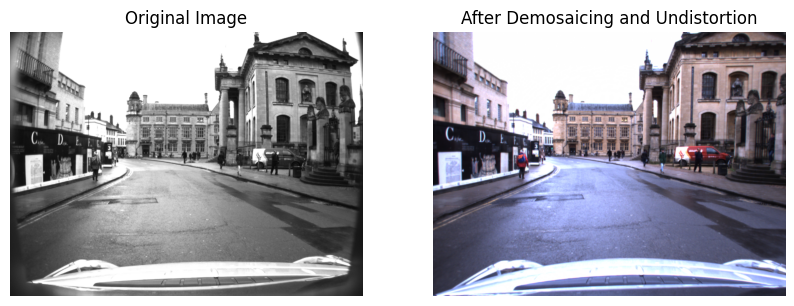

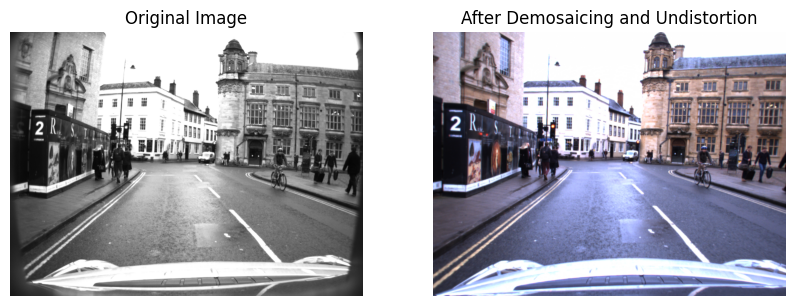

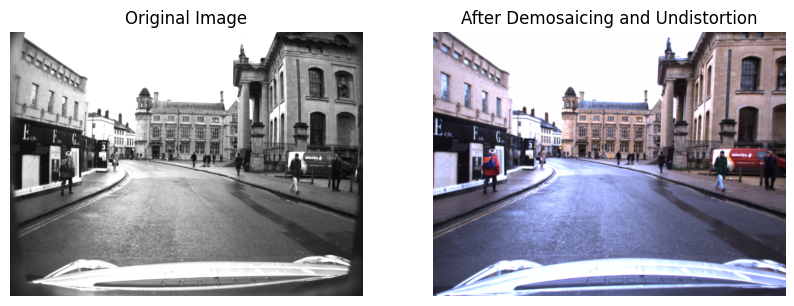

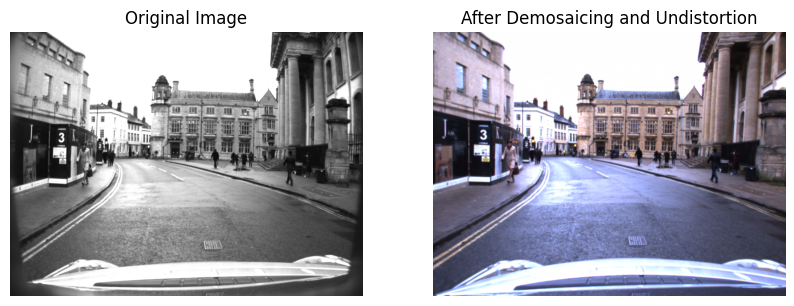

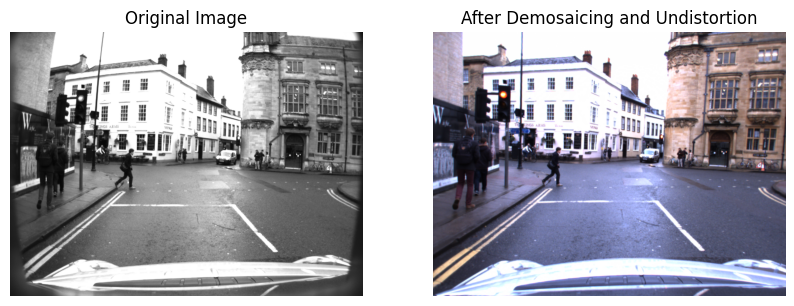

In [29]:
# Directory containing images
directory = "data/stereo/left"

# Create a camera model object if available
models_dir = "robotcar-dataset-sdk/models"  # Replace with the actual path
model = CameraModel(models_dir, directory) if models_dir else None

# Counter to keep track of displayed images
displayed_images = 0

# Iterate through the images in the directory
for filename in os.listdir(directory):
    if not filename.startswith("._") and filename.endswith(".png"):
        image_path = os.path.join(directory, filename)
        image = load_image(image_path, model)
        image_org = Image.open(image_path).convert("RGB")
        
        
      

        # Display the only 5 images
                
        if displayed_images < 5:
            
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(image_org)
            plt.title('Original Image')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(image)
            plt.title('After Demosaicing and Undistortion')
            plt.axis('off')
        
        
        # Save all the images
        save_path = os.path.join("output/stereo/left", filename)
        plt.imsave(save_path, image)
        
        displayed_images += 1

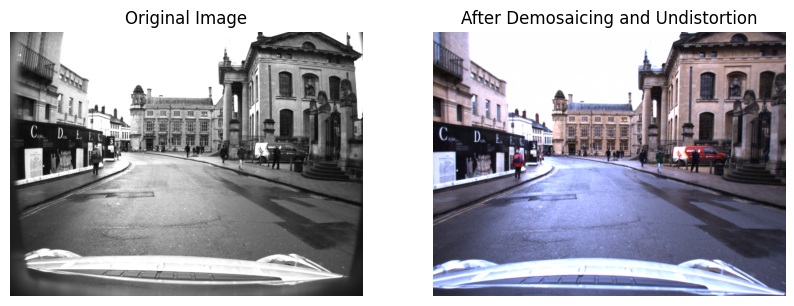

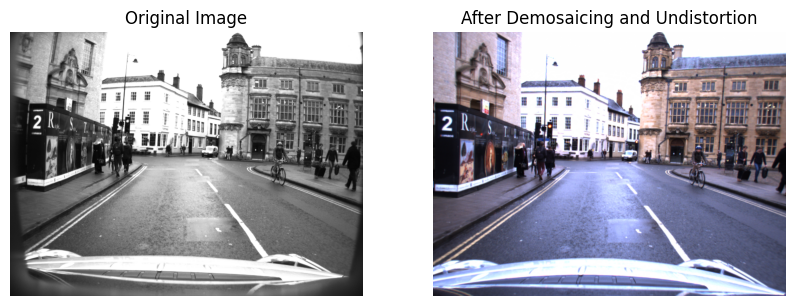

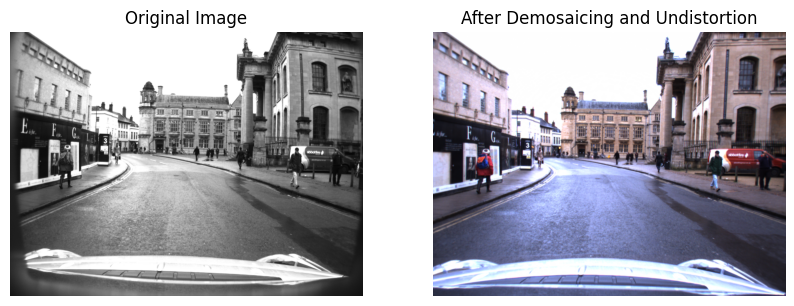

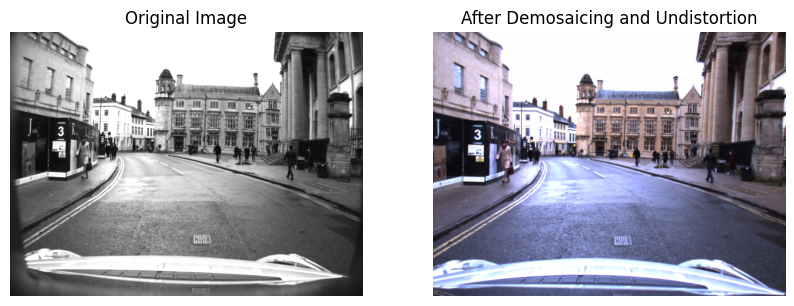

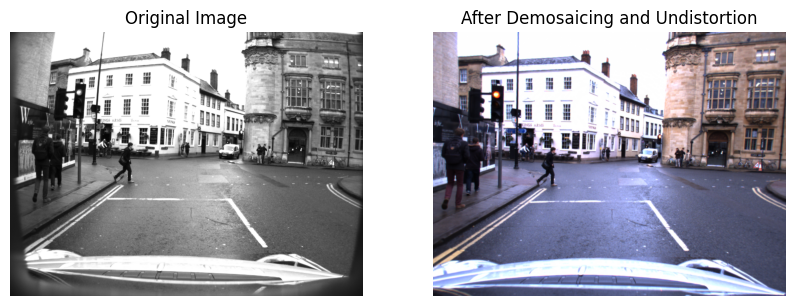

In [30]:
# Directory containing images
directory = "data/stereo/right"

# Create a camera model object if available
models_dir = "robotcar-dataset-sdk/models"  # Replace with the actual path
model = CameraModel(models_dir, directory) if models_dir else None

# Counter to keep track of displayed images
displayed_images = 0

# Iterate through the images in the directory
for filename in os.listdir(directory):
    if not filename.startswith("._") and filename.endswith(".png"):
        image_path = os.path.join(directory, filename)
        image = load_image(image_path, model)
        image_org = Image.open(image_path).convert("RGB")
        
        
      

        # Display the only 5 images
                
        if displayed_images < 5:
            
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(image_org)
            plt.title('Original Image')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(image)
            plt.title('After Demosaicing and Undistortion')
            plt.axis('off')
        
        
        # Save all the images
        save_path = os.path.join("output/stereo/right", filename)
        plt.imsave(save_path, image)
        
        displayed_images += 1

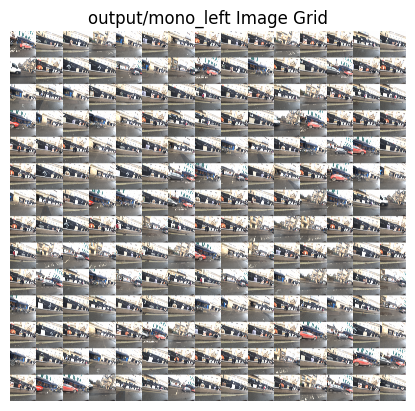

Output Path: output/stitched images/mono_left_concatenated.jpg
Write Success: True


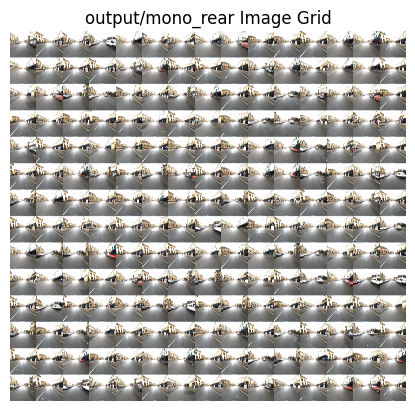

Output Path: output/stitched images/mono_rear_concatenated.jpg
Write Success: True


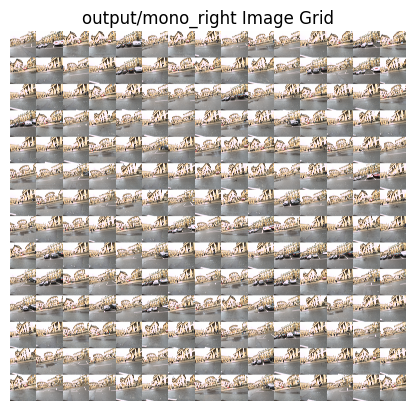

Output Path: output/stitched images/mono_right_concatenated.jpg
Write Success: True


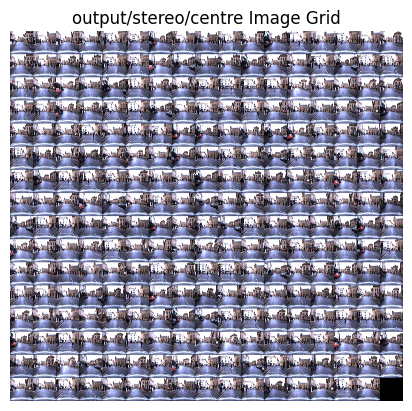

Output Path: output/stitched images/centre_concatenated.jpg
Write Success: True


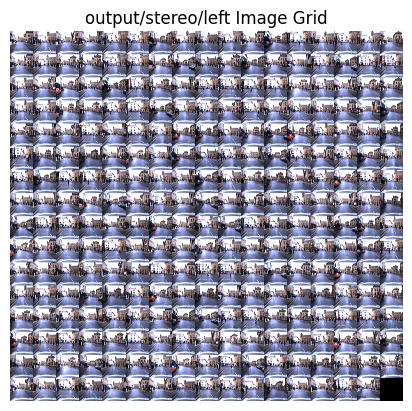

Output Path: output/stitched images/left_concatenated.jpg
Write Success: True


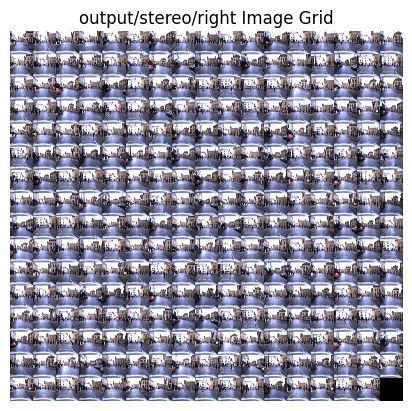

Output Path: output/stitched images/right_concatenated.jpg
Write Success: True


In [34]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to resize images to a specific width and height
def resize_images(images, width, height):
    resized_images = []
    for img in images:
        resized_img = cv2.resize(img, (width, height))
        resized_images.append(resized_img)
    return resized_images

# Function to create a grid of images
def create_image_grid(images):
    # Calculate the number of rows and columns based on the square root of the number of images
    num_images = len(images)
    num_cols = int(np.ceil(np.sqrt(num_images)))
    num_rows = int(np.ceil(num_images / num_cols))
    
    # Create an empty canvas for the grid
    canvas = np.zeros((num_rows * images[0].shape[0], num_cols * images[0].shape[1], 3), dtype=np.uint8)
    
    # Populate the canvas with images
    for i, img in enumerate(images):
        row = i // num_cols
        col = i % num_cols
        canvas[row * img.shape[0]:(row + 1) * img.shape[0], col * img.shape[1]:(col + 1) * img.shape[1]] = img
    
    return canvas

# Define the folders containing the images
folders = ["output/mono_left", "output/mono_rear", "output/mono_right", "output/stereo/centre", "output/stereo/left", "output/stereo/right"]

# Specify the width and height for resizing
width = 1024  # Change this to your desired width
height = 1024  # Change this to your desired height

# Iterate over each folder
for folder in folders:
    # Create a list to store processed images
    processed_images = []
    
    # Process each image in the folder
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            image_path = os.path.join(folder, filename)
            image = cv2.imread(image_path)
            processed_images.append(image)
    
    # Resize the images
    resized_images = resize_images(processed_images, width, height)
    
    # Create the image grid
    image_grid = create_image_grid(resized_images)
    
    # Display the image grid
    plt.imshow(cv2.cvtColor(image_grid, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"{folder} Image Grid")
    plt.show()
    
    output_path = "output/stitched images/" + f"{folder.split('/')[-1]}_concatenated.jpg"  # Extract folder name
    print("Output Path:", output_path)  # Print the output path
    cv2.imwrite(output_path, image_grid)
    success = cv2.imwrite(output_path, image_grid)
    print("Write Success:", success)  # Print if write was successful
    


# **Using the LIDAR, GPS/INS and Visual Odometry generate the 3D Point Cloud**

In [42]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from transform import build_se3_transform
from interpolate_poses import interpolate_vo_poses, interpolate_ins_poses
from velodyne import load_velodyne_raw, load_velodyne_binary, velodyne_raw_to_pointcloud

def build_pointcloud(lidar_dir, poses_file, extrinsics_dir, start_time, end_time, origin_time=-1):
    if origin_time < 0:
        origin_time = start_time

    lidar = re.search('(lms_front|lms_rear|ldmrs|velodyne_left|velodyne_right)', lidar_dir).group(0)
    timestamps_path = os.path.join(lidar_dir, os.pardir, lidar + '.timestamps')

    timestamps = []
    with open(timestamps_path) as timestamps_file:
        for line in timestamps_file:
            timestamp = int(line.split(' ')[0])
            if start_time <= timestamp <= end_time:
                timestamps.append(timestamp)

    if len(timestamps) == 0:
        raise ValueError("No LIDAR data in the given time bracket.")

    with open(os.path.join(extrinsics_dir, lidar + '.txt')) as extrinsics_file:
        extrinsics = next(extrinsics_file)
    G_posesource_laser = build_se3_transform([float(x) for x in extrinsics.split(' ')])

    poses_type = re.search('(vo|ins|rtk)\.csv', poses_file).group(1)

    if poses_type in ['ins', 'rtk']:
        with open(os.path.join(extrinsics_dir, 'ins.txt')) as extrinsics_file:
            extrinsics = next(extrinsics_file)
            G_posesource_laser = np.linalg.solve(build_se3_transform([float(x) for x in extrinsics.split(' ')]),
                                                 G_posesource_laser)

        poses = interpolate_ins_poses(poses_file, timestamps, origin_time, use_rtk=(poses_type == 'rtk'))
    else:
        # sensor is VO, which is located at the main vehicle frame
        poses = interpolate_vo_poses(poses_file, timestamps, origin_time)

    pointcloud = np.array([[0], [0], [0], [0]])
    if lidar == 'ldmrs':
        reflectance = None
    else:
        reflectance = np.empty((0))

    for i in range(0, len(poses)):
        scan_path = os.path.join(lidar_dir, str(timestamps[i]) + '.bin')
        if "velodyne" not in lidar:
            if not os.path.isfile(scan_path):
                continue

            scan_file = open(scan_path)
            scan = np.fromfile(scan_file, np.double)
            scan_file.close()

            scan = scan.reshape((len(scan) // 3, 3)).transpose()

            if lidar != 'ldmrs':
                # LMS scans are tuples of (x, y, reflectance)
                reflectance = np.concatenate((reflectance, np.ravel(scan[2, :])))
                scan[2, :] = np.zeros((1, scan.shape[1]))
        else:
            if os.path.isfile(scan_path):
                ptcld = load_velodyne_binary(scan_path)
            else:
                scan_path = os.path.join(lidar_dir, str(timestamps[i]) + '.png')
                if not os.path.isfile(scan_path):
                    continue
                ranges, intensities, angles, approximate_timestamps = load_velodyne_raw(scan_path)
                ptcld = velodyne_raw_to_pointcloud(ranges, intensities, angles)

            reflectance = np.concatenate((reflectance, ptcld[3]))
            scan = ptcld[:3]

        scan = np.dot(np.dot(poses[i], G_posesource_laser), np.vstack([scan, np.ones((1, scan.shape[1]))]))
        pointcloud = np.hstack([pointcloud, scan])

    pointcloud = pointcloud[:, 1:]
    if pointcloud.shape[1] == 0:
        raise IOError("Could not find scan files for given time range in directory " + lidar_dir)

    return pointcloud, reflectance

def get_dynamic_start_time(lidar_dir):
    lidar = re.search('(lms_front|lms_rear|ldmrs|velodyne_left|velodyne_right)', lidar_dir).group(0)
    timestamps_path = os.path.join(lidar_dir, os.pardir, lidar + '.timestamps')
    with open(timestamps_path) as timestamps_file:
        start_time = int(next(timestamps_file).split(' ')[0])
    return start_time


/tmp/ipykernel_29184/3669324100.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(pointcloud[0], pointcloud[1], pointcloud[2], c=colours, cmap='viridis')


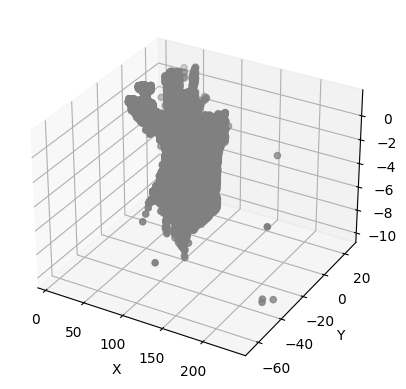

In [45]:
# Set other parameters
lidar_dir = "data/ldmrs"
poses_file = "data/gps/ins.csv"
extrinsics_dir = "robotcar-dataset-sdk/extrinsics"

start_time = get_dynamic_start_time(lidar_dir)
end_time = start_time + 2e7  # Assuming a window duration of 20 million units (adjust as needed)

# Call the build_pointcloud function with the dynamically determined start_time
pointcloud, reflectance = build_pointcloud(lidar_dir, poses_file, extrinsics_dir, start_time, end_time)

if reflectance is not None:
    colours = (reflectance - reflectance.min()) / (reflectance.max() - reflectance.min())
    colours = 1 / (1 + np.exp(-10 * (colours - colours.mean())))
else:
    colours = 'gray'

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pointcloud[0], pointcloud[1], pointcloud[2], c=colours, cmap='viridis')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

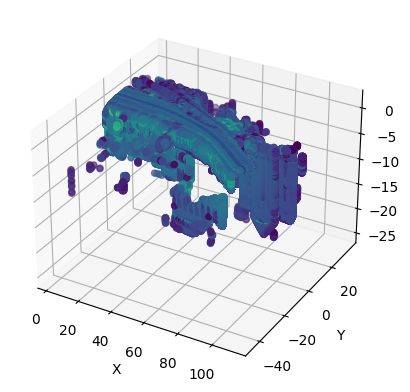

In [46]:
# Set other parameters
lidar_dir = "data/lms_front"
poses_file = "data/gps/ins.csv"
extrinsics_dir = "robotcar-dataset-sdk/extrinsics"

start_time = get_dynamic_start_time(lidar_dir)
end_time = start_time + 2e7  # Assuming a window duration of 20 million units (adjust as needed)

# Call the build_pointcloud function with the dynamically determined start_time
pointcloud, reflectance = build_pointcloud(lidar_dir, poses_file, extrinsics_dir, start_time, end_time)

if reflectance is not None:
    colours = (reflectance - reflectance.min()) / (reflectance.max() - reflectance.min())
    colours = 1 / (1 + np.exp(-10 * (colours - colours.mean())))
else:
    colours = 'gray'

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pointcloud[0], pointcloud[1], pointcloud[2], c=colours, cmap='viridis')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

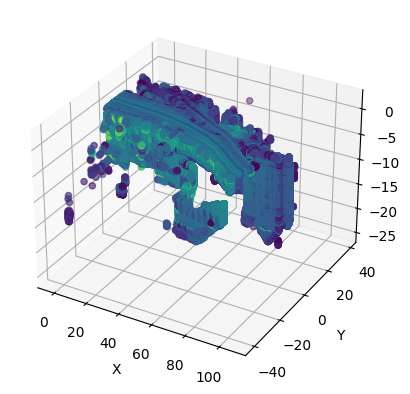

In [47]:
# Set other parameters
lidar_dir = "data/lms_rear"
poses_file = "data/gps/ins.csv"
extrinsics_dir = "robotcar-dataset-sdk/extrinsics"

start_time = get_dynamic_start_time(lidar_dir)
end_time = start_time + 2e7  # Assuming a window duration of 20 million units (adjust as needed)

# Call the build_pointcloud function with the dynamically determined start_time
pointcloud, reflectance = build_pointcloud(lidar_dir, poses_file, extrinsics_dir, start_time, end_time)

if reflectance is not None:
    colours = (reflectance - reflectance.min()) / (reflectance.max() - reflectance.min())
    colours = 1 / (1 + np.exp(-10 * (colours - colours.mean())))
else:
    colours = 'gray'

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pointcloud[0], pointcloud[1], pointcloud[2], c=colours, cmap='viridis')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

In [50]:
def visualize_pointcloud(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx):
    # Load camera model
    model = CameraModel(models_dir, image_dir)
    
    # Load extrinsics
    extrinsics_path = os.path.join(extrinsics_dir, model.camera + '.txt')
    with open(extrinsics_path) as extrinsics_file:
        extrinsics = [float(x) for x in next(extrinsics_file).split(' ')]
    G_camera_vehicle = build_se3_transform(extrinsics)
    
    # Determine camera frame
    poses_type = re.search('(vo|ins|rtk)\.csv', poses_file).group(1)
    if poses_type in ['ins', 'rtk']:
        with open(os.path.join(extrinsics_dir, 'ins.txt')) as extrinsics_file:
            extrinsics = next(extrinsics_file)
            G_camera_posesource = G_camera_vehicle * build_se3_transform([float(x) for x in extrinsics.split(' ')])
    else:
        G_camera_posesource = G_camera_vehicle
    
    # Load image timestamp dynamically
    timestamps_path = os.path.join(image_dir, os.pardir, model.camera + '.timestamps')
    if not os.path.isfile(timestamps_path):
        timestamps_path = os.path.join(image_dir, os.pardir, os.pardir, model.camera + '.timestamps')
    
    timestamp = None
    with open(timestamps_path) as timestamps_file:
        for i, line in enumerate(timestamps_file):
            if i == image_idx:
                timestamp = int(line.split(' ')[0])
                break
    
    if timestamp is None:
        raise ValueError("Image index {} is out of range.".format(image_idx))
    
    # Generate point cloud
    pointcloud, _ = build_pointcloud(laser_dir, poses_file, extrinsics_dir,
                                      timestamp - 1e7, timestamp + 1e7, timestamp)
    
    # Transform point cloud to camera frame
    pointcloud = np.dot(G_camera_posesource, pointcloud)
    
    # Visualize point cloud
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(pointcloud[0], pointcloud[1], pointcloud[2], s=1)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('Point Cloud Visualization for '+ image_dir)
    plt.show()

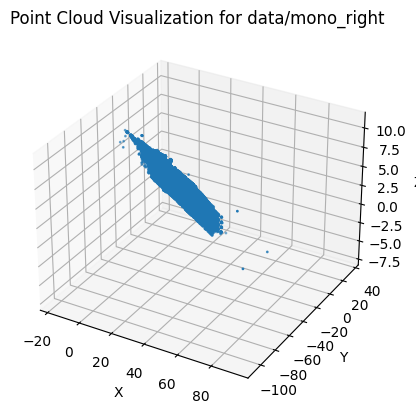

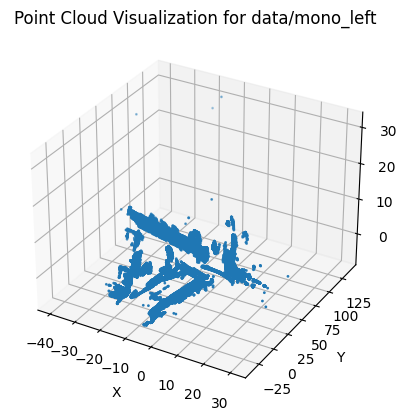

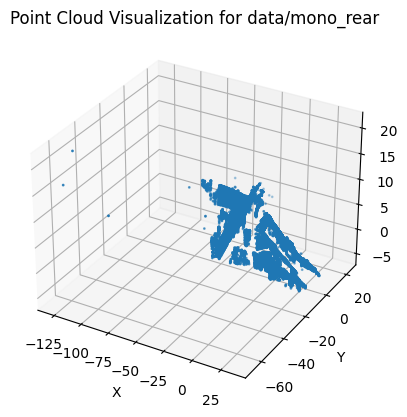

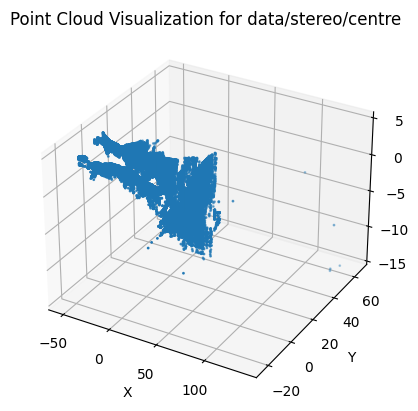

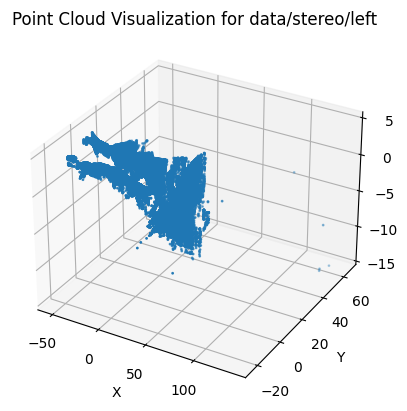

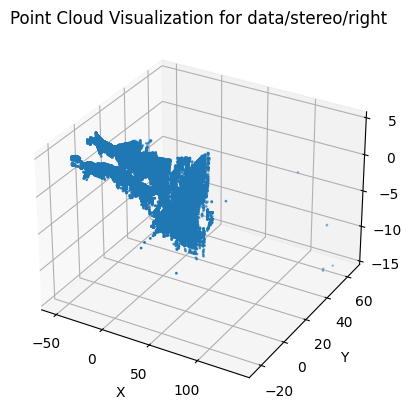

In [51]:
# Example usage
image_dir = "data/mono_right"
laser_dir = "data/ldmrs"
poses_file = "data/gps/ins.csv"
extrinsics_dir = "robotcar-dataset-sdk/extrinsics"
image_idx = 200

visualize_pointcloud(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)
image_dir = "data/mono_left"
visualize_pointcloud(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)
image_dir = "data/mono_rear"
visualize_pointcloud(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)
image_dir = "data/stereo/centre"
visualize_pointcloud(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)
image_dir = "data/stereo/left"
visualize_pointcloud(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)
image_dir = "data/stereo/right"
visualize_pointcloud(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)

# **Project the generated point cloud on the camera image**

In [20]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

def project_points_image(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx):
    from build_pointcloud import build_pointcloud
    from transform import build_se3_transform
    from image import load_image
    from camera_model import CameraModel
    
    model = CameraModel(models_dir, image_dir)

    extrinsics_path = os.path.join(extrinsics_dir, model.camera + '.txt')
    with open(extrinsics_path) as extrinsics_file:
        extrinsics = [float(x) for x in next(extrinsics_file).split(' ')]

    G_camera_vehicle = build_se3_transform(extrinsics)
    G_camera_posesource = None

    poses_type = re.search('(vo|ins|rtk)\.csv', poses_file).group(1)
    if poses_type in ['ins', 'rtk']:
        with open(os.path.join(extrinsics_dir, 'ins.txt')) as extrinsics_file:
            extrinsics = next(extrinsics_file)
            G_camera_posesource = G_camera_vehicle * build_se3_transform([float(x) for x in extrinsics.split(' ')])
    else:
        # VO frame and vehicle frame are the same
        G_camera_posesource = G_camera_vehicle

    timestamps_path = os.path.join(image_dir, os.pardir, model.camera + '.timestamps')
    if not os.path.isfile(timestamps_path):
        timestamps_path = os.path.join(image_dir, os.pardir, os.pardir, model.camera + '.timestamps')

    timestamp = 0
    with open(timestamps_path) as timestamps_file:
        for i, line in enumerate(timestamps_file):
            if i == image_idx:
                timestamp = int(line.split(' ')[0])

    pointcloud, reflectance = build_pointcloud(laser_dir, poses_file, extrinsics_dir,
                                               timestamp - 1e7, timestamp + 1e7, timestamp)

    pointcloud = np.dot(G_camera_posesource, pointcloud)

    image_path = os.path.join(image_dir, str(timestamp) + '.png')
    image = load_image(image_path, model)

    uv, depth = model.project(pointcloud, image.shape)

    plt.imshow(image)
    plt.scatter(np.ravel(uv[0, :]), np.ravel(uv[1, :]), s=2, c=depth, edgecolors='none', cmap='jet')
    plt.xlim(0, image.shape[1])
    plt.ylim(image.shape[0], 0)
    plt.xticks([])
    plt.yticks([])
    plt.show()


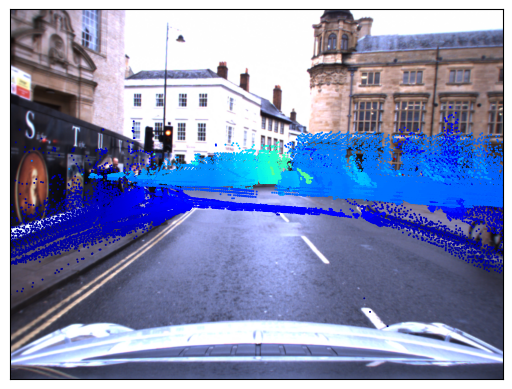

In [21]:
# Inputs
image_dir = "data/stereo/centre"
laser_dir = "data/ldmrs"
poses_file = "data/gps/ins.csv"
models_dir = "robotcar-dataset-sdk/models"
extrinsics_dir = "robotcar-dataset-sdk/extrinsics"
image_idx = 200

project_points_image(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)

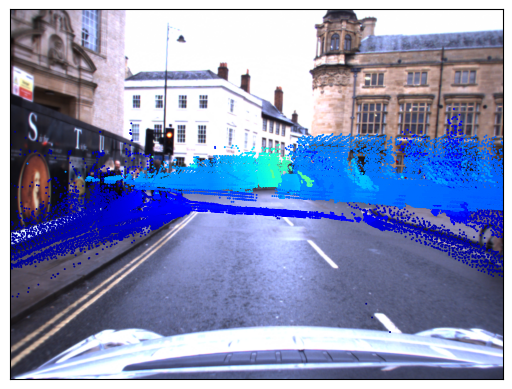

In [37]:
# Inputs
image_dir = "data/stereo/left"
laser_dir = "data/ldmrs"
poses_file = "data/gps/ins.csv"
models_dir = "robotcar-dataset-sdk/models"
extrinsics_dir = "robotcar-dataset-sdk/extrinsics"
image_idx = 200

project_points_image(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)

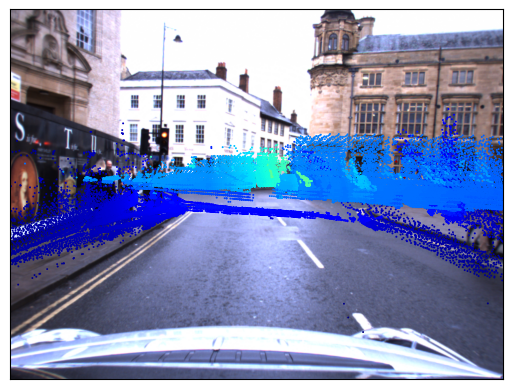

In [38]:
# Inputs
image_dir = "data/stereo/right"
laser_dir = "data/ldmrs"
poses_file = "data/gps/ins.csv"
models_dir = "robotcar-dataset-sdk/models"
extrinsics_dir = "robotcar-dataset-sdk/extrinsics"
image_idx = 200

project_points_image(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)

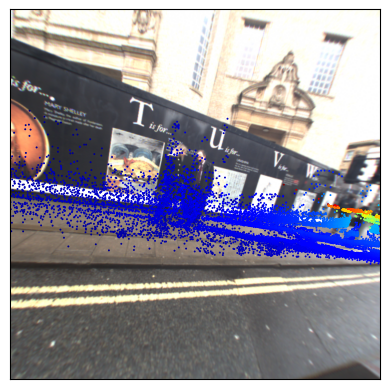

In [39]:
# Inputs
image_dir = "data/mono_left"
laser_dir = "data/ldmrs"
poses_file = "data/gps/ins.csv"
models_dir = "robotcar-dataset-sdk/models"
extrinsics_dir = "robotcar-dataset-sdk/extrinsics"
image_idx = 200

project_points_image(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)

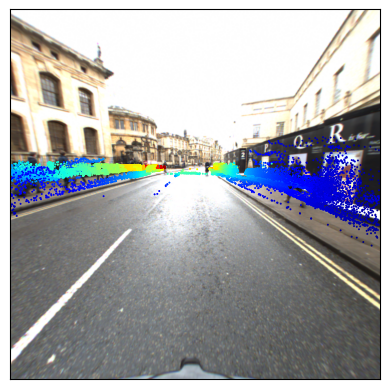

In [40]:
# Inputs
image_dir = "data/mono_rear"
laser_dir = "data/ldmrs"
poses_file = "data/gps/ins.csv"
models_dir = "robotcar-dataset-sdk/models"
extrinsics_dir = "robotcar-dataset-sdk/extrinsics"
image_idx = 200

project_points_image(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)

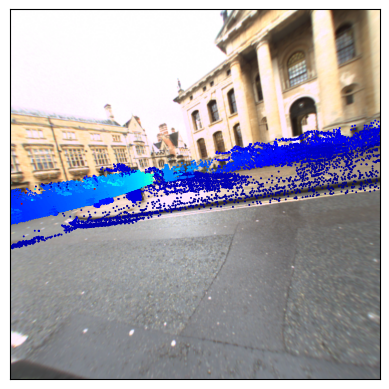

In [41]:
# Inputs
image_dir = "data/mono_right"
laser_dir = "data/ldmrs"
poses_file = "data/gps/ins.csv"
models_dir = "robotcar-dataset-sdk/models"
extrinsics_dir = "robotcar-dataset-sdk/extrinsics"
image_idx = 200

project_points_image(image_dir, laser_dir, poses_file, models_dir, extrinsics_dir, image_idx)